In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

In [3]:
G = nx.read_graphml('london.xml')
pos=nx.get_node_attributes(G,'coords')

In [4]:
for keys in pos:
    pos[keys] = eval(pos[keys])

In [5]:
fig = plt.figure(1, figsize=(40, 40), dpi=200)

# Plot graph
nx.draw(G,pos,
        with_labels = True,
        node_size=800,
        font_size=4,
        font_color='black',
        edge_color='gray',
        width=0.4)

In [6]:
nx.info(G)

/tmp/ipykernel_678/1064119803.py:1: DeprecationWarning: info is deprecated and will be removed in version 3.0.

  nx.info(G)


'Graph with 401 nodes and 467 edges'

In [7]:
all_degrees=nx.degree(G)
sorted(list(all_degrees), key = lambda x:-x[1])[0:10]

[('Stratford', 9),
 ('Bank and Monument', 8),
 ('Baker Street', 7),
 ("King's Cross St. Pancras", 7),
 ('West Ham', 6),
 ('Canning Town', 6),
 ('Waterloo', 6),
 ('Green Park', 6),
 ('Oxford Circus', 6),
 ('Liverpool Street', 6)]

In [8]:
dict(all_degrees)

{'Wembley Park': 4,
 'Kingsbury': 2,
 'Queensbury': 2,
 'Canons Park': 2,
 'Stanmore': 1,
 'Stratford': 9,
 'West Ham': 6,
 'Canning Town': 6,
 'North Greenwich': 2,
 'Canary Wharf': 4,
 'Canada Water': 4,
 'Bermondsey': 2,
 'London Bridge': 4,
 'Southwark': 2,
 'Waterloo': 6,
 'Westminster': 4,
 'Green Park': 6,
 'Bond Street': 4,
 'Baker Street': 7,
 "St. John's Wood": 2,
 'Swiss Cottage': 2,
 'Finchley Road': 4,
 'Neasden': 2,
 'Dollis Hill': 2,
 'Willesden Green': 2,
 'Kilburn': 2,
 'West Hampstead': 4,
 'West Acton': 2,
 'Ealing Broadway': 2,
 'North Acton': 3,
 'West Ruislip': 1,
 'Ruislip Gardens': 2,
 'South Ruislip': 2,
 'Northolt': 2,
 'Greenford': 2,
 'Perivale': 2,
 'Hanger Lane': 2,
 'East Acton': 2,
 'White City': 2,
 "Shepherd's Bush": 4,
 'Holland Park': 2,
 'Notting Hill Gate': 4,
 'Queensway': 2,
 'Lancaster Gate': 2,
 'Marble Arch': 2,
 'Oxford Circus': 6,
 'Tottenham Court Road': 4,
 'Holborn': 4,
 'Chancery Lane': 2,
 "St. Paul's": 2,
 'Bank and Monument': 8,
 'Liv

In [9]:
nx.set_node_attributes(G,dict(all_degrees),'degree')

In [10]:
deg_color=[(node['degree']) for i, node in G.nodes(data=True)]
deg_size=[(float(node['degree'])/max(deg_color)*800) for i, node in G.nodes(data=True)]

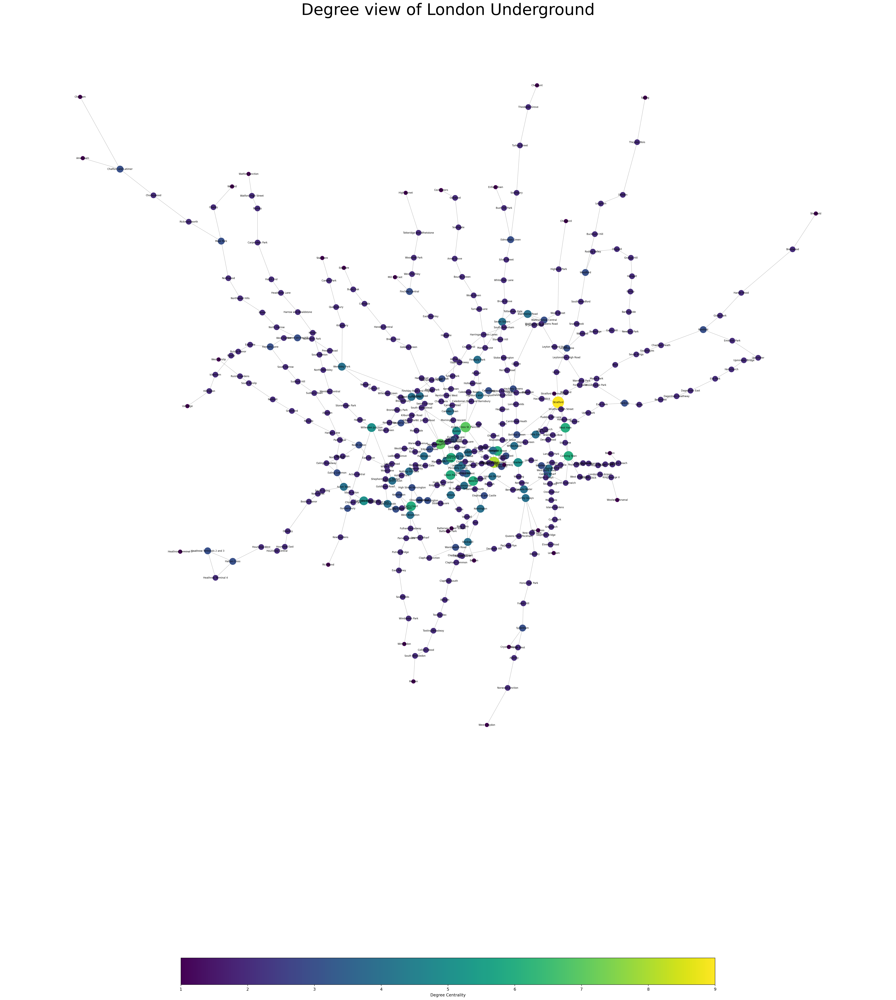

In [44]:
fig, ax = plt.subplots(figsize=(40,50), dpi=200)

nx.draw_networkx_labels(G, pos,font_size=6, font_color='black')
nx.draw_networkx_edges(G, pos,edge_color='gray', width=0.4)
nod=nx.draw_networkx_nodes(G,
        pos = pos,
        node_color= deg_color,
        node_size= deg_size)

plt.colorbar(nod,label="Degree Centrality",orientation="horizontal", shrink=0.6)
plt.axis("off")
plt.title("Degree view of London Underground",fontsize=40)
plt.show()

In [12]:
all_deg_norm =nx.degree_centrality(G)


nx.set_node_attributes(G,dict(all_deg_norm),'degree_norm')

deg_color_norm=[(node['degree_norm']) for i, node in G.nodes(data=True)]
deg_size_norm=[(node['degree_norm']*50000) for i, node in G.nodes(data=True)]

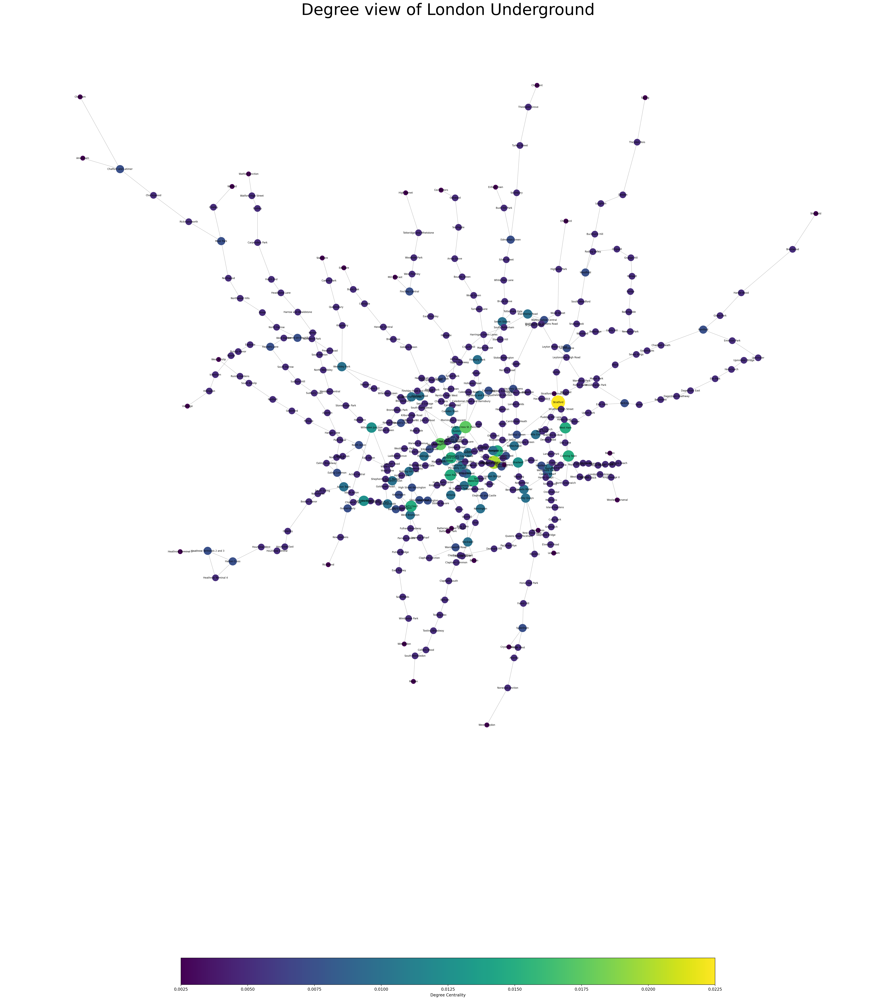

In [45]:
fig, ax = plt.subplots(figsize=(40, 50), dpi=200)

nx.draw_networkx_edges(G, pos,edge_color='gray', width=0.4)
nx.draw_networkx_labels(G, pos,font_size=6, font_color='black')
nod=nx.draw_networkx_nodes(G,
        pos = pos,
        node_color= deg_color_norm,
        node_size= deg_size_norm)

plt.colorbar(nod,label="Degree Centrality",orientation="horizontal", shrink=0.6)
plt.axis("off")
plt.title("Degree view of London Underground",fontsize=40)
plt.show()



In [14]:
#topological closeness
all_clos_top=nx.closeness_centrality(G)

# Let us add the closeness centrality as attribute to the nodes in the graph
nx.set_node_attributes(G,all_clos_top,'closeness_top')


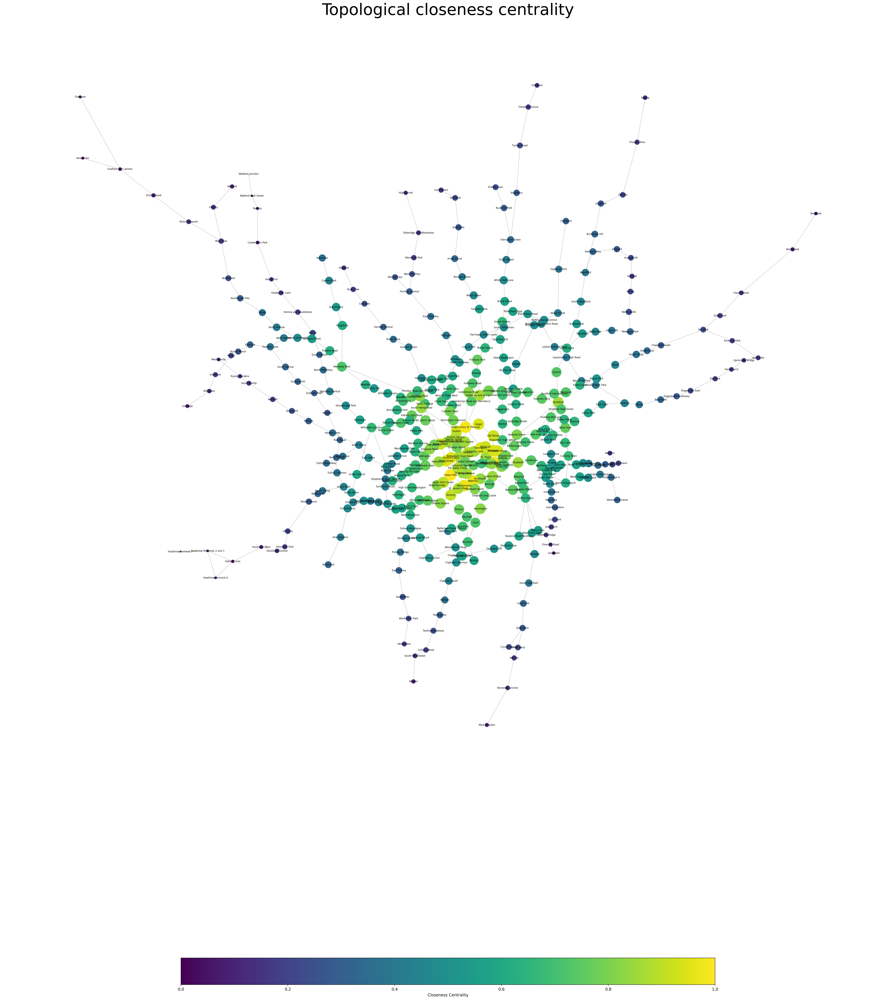

In [46]:

# Set color and size
# Closeness values
clos_val=[(i[1]['closeness_top']) for i in G.nodes(data=True)]


normalised_clos_top=[((i[1]['closeness_top']-min(clos_val))/(max(clos_val)-min(clos_val))) for i in G.nodes(data=True)]
clos_top_dad_size=[((i[1]['closeness_top']-min(clos_val))/(max(clos_val)-min(clos_val))*800) for i in G.nodes(data=True)]

# Plot graph
fig, ax = plt.subplots(figsize=(40,50),dpi=200)

nx.draw_networkx_edges(G, pos,edge_color='gray', 
        width=0.4)
nx.draw_networkx_labels(G, pos,font_size=6,
        font_color='black')
nod=nx.draw_networkx_nodes(G,
        pos = pos,
        node_color= normalised_clos_top,
        node_size=clos_top_dad_size )

plt.colorbar(nod,label="Closeness Centrality",orientation="horizontal", shrink=0.6)
plt.axis("off")
plt.title("Topological closeness centrality",fontsize=40)
plt.show()

In [47]:
pd.DataFrame.from_dict(all_clos_top,columns=['closeness_top'],orient='index').sort_values(by='closeness_top', ascending=False)[0:10]

,closeness_top
Green Park,0.114778
Bank and Monument,0.113572
King's Cross St. Pancras,0.113443
Westminster,0.112549
Waterloo,0.112265
Oxford Circus,0.111204
Bond Street,0.110988
Farringdon,0.110742
Angel,0.110742
Moorgate,0.110314


In [48]:
#Let us compute the betweenness centrality for the network 
all_bet_top=nx.betweenness_centrality(G, normalized=False)

pd.DataFrame.from_dict(all_bet_top,columns=['betweenness_top'],orient='index').sort_values(by='betweenness_top', ascending=False)[0:10]

,betweenness_top
Stratford,23768.093434
Bank and Monument,23181.058947
Liverpool Street,21610.387049
King's Cross St. Pancras,20373.521465
Waterloo,19464.882323
Green Park,17223.622114
Euston,16624.275469
Westminster,16226.155916
Baker Street,15287.107612
Finchley Road,13173.758009


In [49]:
# Let us add the betweenness centrality as attribute to the nodes in the graph
nx.set_node_attributes(G,all_bet_top,'betweenness_top')

betweenness_top_values=[(i[1]['betweenness_top']) for i in G.nodes(data=True)]

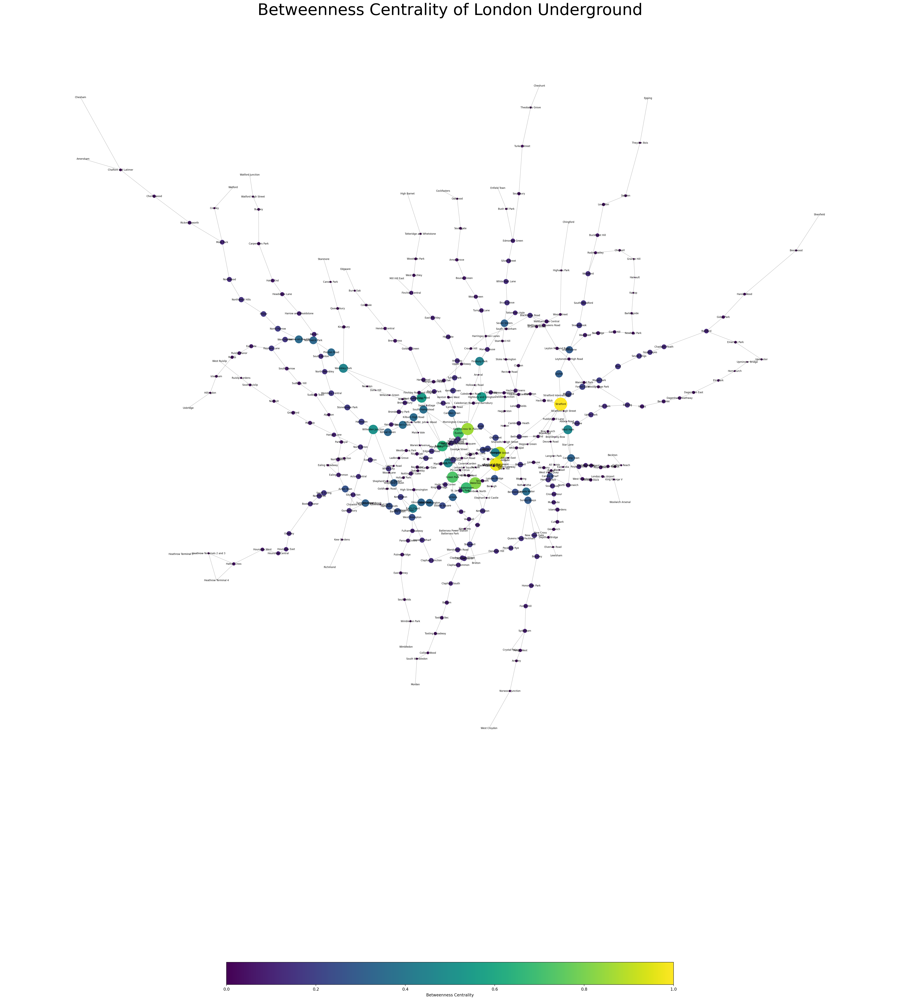

In [50]:
# Lets set color and size of nodes according to betweenness values
bet_color_top=[(i[1]['betweenness_top']/max(betweenness_top_values)) for i in G.nodes(data=True)]
bet_size_top=[(i[1]['betweenness_top']/max(betweenness_top_values)*1000) for i in G.nodes(data=True)]

# Plot graph
fig, ax = plt.subplots(figsize=(40,50), dpi=200)

nx.draw_networkx_edges(G, pos,edge_color='gray', width=0.4)
nx.draw_networkx_labels(G, pos,font_size=6, font_color='black')
nod=nx.draw_networkx_nodes(G,
        pos = pos,
        node_color= bet_color_top,
        node_size= bet_size_top)

plt.colorbar(nod,label="Betweenness Centrality",orientation="horizontal", shrink=0.5)
plt.axis("off")
plt.title("Betweenness Centrality of London Underground",fontsize=40)
plt.show()

In [51]:
list(G.nodes(data = True))[0:5]

[('Wembley Park',
  {'coords': '(519316.5590174915, 186389.32981656672)',
   'degree': 4,
   'degree_norm': 0.01,
   'closeness_top': 0.09465215333648841,
   'betweenness_top': 10780.813492063491}),
 ('Kingsbury',
  {'coords': '(519359.9688603217, 188721.22027255083)',
   'degree': 2,
   'degree_norm': 0.005,
   'closeness_top': 0.08659883091578263,
   'betweenness_top': 1191.0}),
 ('Queensbury',
  {'coords': '(518811.3613368616, 189760.50737704366)',
   'degree': 2,
   'degree_norm': 0.005,
   'closeness_top': 0.07977662544874352,
   'betweenness_top': 796.0}),
 ('Canons Park',
  {'coords': '(518183.29968291725, 191257.26260848)',
   'degree': 2,
   'degree_norm': 0.005,
   'closeness_top': 0.07392348918868971,
   'betweenness_top': 399.0}),
 ('Stanmore',
  {'coords': '(517580.4596464033, 192537.99948098673)',
   'degree': 1,
   'degree_norm': 0.0025,
   'closeness_top': 0.06884681583476764,
   'betweenness_top': 0.0})]

In [52]:
Gcc = sorted(nx.connected_components(G), key=len, reverse=True)
G0 = G.subgraph(Gcc[0])

In [53]:
fig = plt.figure(1, figsize=(50, 50), dpi=200)

# Plot graph
nx.draw(G0, pos,
        with_labels = True,
        node_size=1000,
        font_size=4,
        font_color='black',
        edge_color='gray',
        width=0.4)

We define function to show impact of node removal

In [54]:
from networkx.algorithms import global_efficiency
# non-sequential removal
def removal(G, n = 10):
    new_G = G.copy()
    all_deg_norm =nx.degree_centrality(new_G)
    all_deg_norm = sorted(all_deg_norm.items(), key = lambda x: -x[1])
    
    Gcc = sorted(nx.connected_components(new_G), key=len, reverse=True)
    G0 = new_G.subgraph(Gcc[0])
    before_LCC = len(G0)
    before_eff = global_efficiency(new_G)
    LCC_list1, eff_list1 = [before_LCC], [before_eff]
    print("Degree Centrality:")
    for i in range(n):
        new_G.remove_node(all_deg_norm[i][0])
        Gcc = sorted(nx.connected_components(new_G), key=len, reverse=True)
        G0 = new_G.subgraph(Gcc[0])
        new_LCC = len(G0)
        new_eff = global_efficiency(new_G)
        print(f"Remove {i+1} nodes: before LCC {before_LCC}, after LCC{new_LCC}, before eff {before_eff}, after eff {new_eff}")
        before_LCC, before_eff = new_LCC, new_eff
        LCC_list1.append(new_LCC)
        eff_list1.append(new_eff)
    print()

    new_G = G.copy()
    all_close =nx.closeness_centrality(new_G)
    all_close = sorted(all_close.items(), key = lambda x: -x[1])
    
    Gcc = sorted(nx.connected_components(new_G), key=len, reverse=True)
    G0 = new_G.subgraph(Gcc[0])
    before_LCC = len(G0)
    before_eff = global_efficiency(new_G)
    LCC_list2, eff_list2 = [before_LCC], [before_eff]
    print("Closeness Centrality:")
    for i in range(n):
        new_G.remove_node(all_close[i][0])
        Gcc = sorted(nx.connected_components(new_G), key=len, reverse=True)
        G0 = new_G.subgraph(Gcc[0])
        new_LCC = len(G0)
        new_eff = global_efficiency(new_G)
        print(f"Remove {i+1} nodes: before LCC {before_LCC}, after LCC{new_LCC}, before eff {before_eff}, after eff {new_eff}")
        before_LCC, before_eff = new_LCC, new_eff
        
        LCC_list2.append(new_LCC)
        eff_list2.append(new_eff)
    print()

    new_G = G.copy()
    all_between =nx.betweenness_centrality(new_G)
    all_between = sorted(all_between.items(), key = lambda x: -x[1])
    
    Gcc = sorted(nx.connected_components(new_G), key=len, reverse=True)
    G0 = new_G.subgraph(Gcc[0])
    before_LCC = len(G0)
    before_eff = global_efficiency(new_G)
    LCC_list3, eff_list3 = [before_LCC], [before_eff]
    print("Betweeness Centrality:")
    for i in range(n):
        new_G.remove_node(all_between[i][0])
        Gcc = sorted(nx.connected_components(new_G), key=len, reverse=True)
        G0 = new_G.subgraph(Gcc[0])
        new_LCC = len(G0)
        new_eff = global_efficiency(new_G)
        print(f"Remove {i+1} nodes: before LCC {before_LCC}, after LCC{new_LCC}, before eff {before_eff}, after eff {new_eff}")
        before_LCC, before_eff = new_LCC, new_eff
        
        LCC_list3.append(new_LCC)
        eff_list3.append(new_eff)
    print()
    return LCC_list1, eff_list1, LCC_list2, eff_list2, LCC_list3, eff_list3

In [55]:
l1, e1, l2, e2, l3, e3 = removal(G)

Degree Centrality:
Remove 1 nodes: before LCC 401, after LCC379, before eff 0.1012561935972123, after eff 0.08891736066510689
Remove 2 nodes: before LCC 379, after LCC378, before eff 0.08891736066510689, after eff 0.08586164448742485
Remove 3 nodes: before LCC 378, after LCC377, before eff 0.08586164448742485, after eff 0.08203328759057034
Remove 4 nodes: before LCC 377, after LCC374, before eff 0.08203328759057034, after eff 0.07570039409751211
Remove 5 nodes: before LCC 374, after LCC371, before eff 0.07570039409751211, after eff 0.07302243396164704
Remove 6 nodes: before LCC 371, after LCC356, before eff 0.07302243396164704, after eff 0.06893502024058405
Remove 7 nodes: before LCC 356, after LCC355, before eff 0.06893502024058405, after eff 0.06721932836875794
Remove 8 nodes: before LCC 355, after LCC354, before eff 0.06721932836875794, after eff 0.06622091057392582
Remove 9 nodes: before LCC 354, after LCC352, before eff 0.06622091057392582, after eff 0.06536196059296152
Remove 10 

In [56]:
# sequential removal
def removal_seq (G, n = 10):
    new_G = G.copy()
    all_deg_norm =nx.degree_centrality(new_G)
    all_deg_norm = sorted(all_deg_norm.items(), key = lambda x: -x[1])
    
    Gcc = sorted(nx.connected_components(new_G), key=len, reverse=True)
    G0 = new_G.subgraph(Gcc[0])
    before_LCC = len(G0)
    before_eff = global_efficiency(new_G)
    LCC_list1, eff_list1 = [before_LCC], [before_eff]
    print("Degree Centrality:")
    for i in range(n):
        new_G.remove_node(all_deg_norm[0][0])
        Gcc = sorted(nx.connected_components(new_G), key=len, reverse=True)
        G0 = new_G.subgraph(Gcc[0])
        new_LCC = len(G0)
        new_eff = global_efficiency(new_G)
        print(f"Remove {i+1} nodes: before LCC {before_LCC}, after LCC{new_LCC}, before eff {before_eff}, after eff {new_eff}")
        before_LCC, before_eff = new_LCC, new_eff

        all_deg_norm =nx.degree_centrality(new_G)
        all_deg_norm = sorted(all_deg_norm.items(), key = lambda x: -x[1])
        LCC_list1.append(new_LCC)
        eff_list1.append(new_eff)
    print()

    new_G = G.copy()
    all_close =nx.closeness_centrality(new_G)
    all_close = sorted(all_close.items(), key = lambda x: -x[1])
    
    Gcc = sorted(nx.connected_components(new_G), key=len, reverse=True)
    G0 = new_G.subgraph(Gcc[0])
    before_LCC = len(G0)
    before_eff = global_efficiency(new_G)
    LCC_list2, eff_list2 = [before_LCC], [before_eff]
    print("Closeness Centrality:")
    for i in range(n):
        new_G.remove_node(all_close[0][0])
        Gcc = sorted(nx.connected_components(new_G), key=len, reverse=True)
        G0 = new_G.subgraph(Gcc[0])
        new_LCC = len(G0)
        new_eff = global_efficiency(new_G)
        print(f"Remove {i+1} nodes: before LCC {before_LCC}, after LCC{new_LCC}, before eff {before_eff}, after eff {new_eff}")
        before_LCC, before_eff = new_LCC, new_eff

        all_close =nx.closeness_centrality(new_G)
        all_close = sorted(all_close.items(), key = lambda x: -x[1])
        LCC_list2.append(new_LCC)
        eff_list2.append(new_eff)
    print()

    new_G = G.copy()
    all_between =nx.betweenness_centrality(new_G)
    all_between = sorted(all_between.items(), key = lambda x: -x[1])
    
    Gcc = sorted(nx.connected_components(new_G), key=len, reverse=True)
    G0 = new_G.subgraph(Gcc[0])
    before_LCC = len(G0)
    before_eff = global_efficiency(new_G)
    LCC_list3, eff_list3 = [before_LCC], [before_eff]
    print("Betweeness Centrality:")
    for i in range(n):
        new_G.remove_node(all_between[0][0])
        Gcc = sorted(nx.connected_components(new_G), key=len, reverse=True)
        G0 = new_G.subgraph(Gcc[0])
        new_LCC = len(G0)
        new_eff = global_efficiency(new_G)
        print(f"Remove {i+1} nodes: before LCC {before_LCC}, after LCC{new_LCC}, before eff {before_eff}, after eff {new_eff}")
        before_LCC, before_eff = new_LCC, new_eff

        all_between =nx.betweenness_centrality(new_G)
        all_between = sorted(all_between.items(), key = lambda x: -x[1])
        
        LCC_list3.append(new_LCC)
        eff_list3.append(new_eff)
    print()

    
    return LCC_list1, eff_list1, LCC_list2, eff_list2, LCC_list3, eff_list3

In [57]:
l11, e11, l21, e21, l31, e31 = removal_seq(G)

Degree Centrality:
Remove 1 nodes: before LCC 401, after LCC379, before eff 0.1012561935972123, after eff 0.08891736066510689
Remove 2 nodes: before LCC 379, after LCC378, before eff 0.08891736066510689, after eff 0.08586164448742485
Remove 3 nodes: before LCC 378, after LCC377, before eff 0.08586164448742485, after eff 0.08203328759057034
Remove 4 nodes: before LCC 377, after LCC374, before eff 0.08203328759057034, after eff 0.07570039409751211
Remove 5 nodes: before LCC 374, after LCC360, before eff 0.07570039409751211, after eff 0.07039592695635104
Remove 6 nodes: before LCC 360, after LCC359, before eff 0.07039592695635104, after eff 0.06940235301523284
Remove 7 nodes: before LCC 359, after LCC358, before eff 0.06940235301523284, after eff 0.0677717604548151
Remove 8 nodes: before LCC 358, after LCC357, before eff 0.0677717604548151, after eff 0.06593580277595987
Remove 9 nodes: before LCC 357, after LCC355, before eff 0.06593580277595987, after eff 0.06506900122239155
Remove 10 no

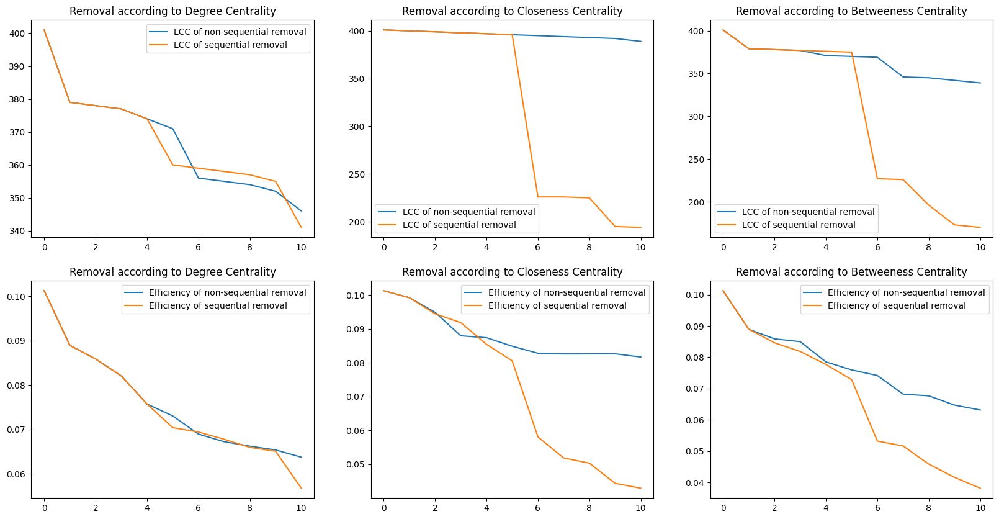

In [58]:
fig, axs = plt.subplots(2,3, figsize = (20,10))

axs[0,0].plot(list(range(0, 11)), l1, label = "LCC of non-sequential removal")
axs[0,0].plot(list(range(0, 11)), l11, label = "LCC of sequential removal")
axs[0,0].set_title("Removal according to Degree Centrality")
axs[0,0].legend()

axs[0,1].plot(list(range(0, 11)), l2, label = "LCC of non-sequential removal")
axs[0,1].plot(list(range(0, 11)), l21, label = "LCC of sequential removal")
axs[0,1].set_title("Removal according to Closeness Centrality")
axs[0,1].legend()

axs[0,2].plot(list(range(0, 11)), l3, label = "LCC of non-sequential removal")
axs[0,2].plot(list(range(0, 11)), l31, label = "LCC of sequential removal")
axs[0,2].set_title("Removal according to Betweeness Centrality")
axs[0,2].legend()

axs[1,0].plot(list(range(0, 11)), e1, label = "Efficiency of non-sequential removal")
axs[1,0].plot(list(range(0, 11)), e11, label = "Efficiency of sequential removal")
axs[1,0].set_title("Removal according to Degree Centrality")
axs[1,0].legend()

axs[1,1].plot(list(range(0, 11)), e2, label = "Efficiency of non-sequential removal")
axs[1,1].plot(list(range(0, 11)), e21, label = "Efficiency of sequential removal")
axs[1,1].set_title("Removal according to Closeness Centrality")
axs[1,1].legend()

axs[1,2].plot(list(range(0, 11)), e3, label = "Efficiency of non-sequential removal")
axs[1,2].plot(list(range(0, 11)), e31, label = "Efficiency of sequential removal")
axs[1,2].set_title("Removal according to Betweeness Centrality")
axs[1,2].legend()

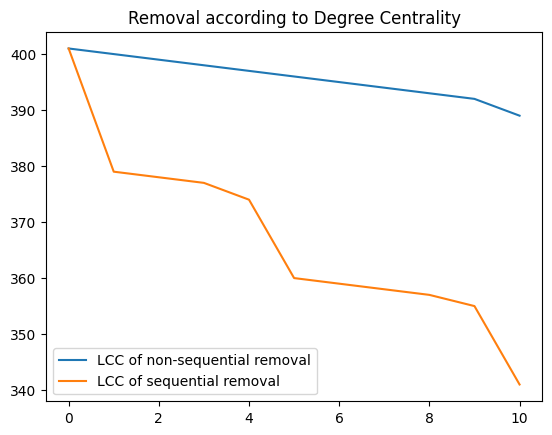

In [59]:
plt.plot(list(range(0, 11)), l2, label = "LCC of non-sequential removal")
plt.plot(list(range(0, 11)), l11, label = "LCC of sequential removal")
plt.title("Removal according to Degree Centrality")
plt.legend()
plt.show()

Next, we consider the flows as weight.

In [60]:
file_network['flows'] += 1 # get rid of the inf in calculating inverse.
new_G = nx.from_pandas_edgelist(file_network, 'station_origin', 'station_destination', ['distance','flows'])

In [61]:
all_bet_top=nx.betweenness_centrality(new_G, weight='flows', normalized=True)


In [62]:
pd.DataFrame.from_dict(all_bet_top,columns=['betweenness_top'],orient='index').sort_values(by='betweenness_top', ascending=False)[0:10]

,betweenness_top
West Ham,0.126572
Kensington,0.067414
Stratford,0.065518
Shenfield,0.054379
Kew Gardens,0.028675
West Brompton,0.024148
Richmond,0.022870
Willesden Junction,0.021476
Highbury & Islington,0.020709
Harrow & Wealdstone,0.020499


In [63]:
from itertools import permutations
# weighted efficiency
def global_efficiency_weighted(G):
   n = len(G)
   denom = n * (n - 1)
   if denom != 0:
        shortest_paths = dict(nx.all_pairs_dijkstra(G, weight = 'flows'))
        g_eff = 0
        for u, v in list(permutations(G, 2)):
            g_eff += 1./shortest_paths[u][0][v] if shortest_paths[u][0][v] !=0 else 0
        g_eff /= denom
   else:
       g_eff = 0
   return g_eff

new_G1 = new_G.copy()
all_between =nx.betweenness_centrality(new_G1)
all_between = sorted(all_between.items(), key = lambda x: -x[1])

# remove using original betweeness centrality
print(all_between[:10])
Gcc = sorted(nx.connected_components(new_G1), key=len, reverse=True)
G0 = new_G1.subgraph(Gcc[0])
before_LCC = len(G0)
before_eff = global_efficiency_weighted(new_G1)
print("Betweeness Centrality:")
new_G1.remove_node(all_between[0][0])
Gcc = sorted(nx.connected_components(new_G1), key=len, reverse=True)
G0 = new_G1.subgraph(Gcc[0])
new_LCC = len(G0)
new_eff = global_efficiency_weighted(new_G1)
print(f"Remove 1 nodes: before LCC {before_LCC}, after LCC{new_LCC}, before eff {before_eff}, after eff {new_eff}")

# remove using adjusted betweeness centrality
new_G1 = new_G.copy()
all_between =nx.betweenness_centrality(new_G1, weight='flows')
all_between = sorted(all_between.items(), key = lambda x: -x[1])
print(all_between[:10])
Gcc = sorted(nx.connected_components(new_G1), key=len, reverse=True)
G0 = new_G1.subgraph(Gcc[0])
before_LCC = len(G0)
before_eff = global_efficiency_weighted(new_G1)
print("Betweeness Centrality:")
new_G1.remove_node(all_between[0][0])
Gcc = sorted(nx.connected_components(new_G1), key=len, reverse=True)
G0 = new_G1.subgraph(Gcc[0])
new_LCC = len(G0)
new_eff = global_efficiency_weighted(new_G1)
print(f"Remove 1 nodes: before LCC {before_LCC}, after LCC{new_LCC}, before eff {before_eff}, after eff {new_eff}")
print()

[('Stratford', 0.09855280271613572), ('Liverpool Street', 0.034307268834965696), ('Bank and Monument', 0.02795625394929902), ('Canary Wharf', 0.02795625394929902), ('Canning Town', 0.02775651590896629), ('West Ham', 0.024551495905168516), ('Highbury & Islington', 0.023023227287027857), ('Whitechapel', 0.019682365805384537), ('Canada Water', 0.017897771764649514), ('Shadwell', 0.017070097362743068)]
Betweeness Centrality:
Remove 1 nodes: before LCC 399, after LCC398, before eff 0.25549046432284184, after eff 0.25461223504817626
[('West Ham', 0.12657248846771046), ('Kensington', 0.06741443534446095), ('Stratford', 0.06551811117553369), ('Shenfield', 0.05437894655384843), ('Kew Gardens', 0.028674963210641512), ('West Brompton', 0.024148465230382696), ('Richmond', 0.02286962967405635), ('Willesden Junction', 0.021476002985548148), ('Highbury & Islington', 0.020709155481909065), ('Harrow & Wealdstone', 0.02049882282713292)]
Betweeness Centrality:
Remove 1 nodes: before LCC 399, after LCC398